In [419]:
import sys
python = sys.executable # get python executable path
print(python)

for i in ["numpy",  "scipy", "matplotlib", "pandas", "opencv-python", "opencv-contrib-python"]: # declare what packages we need
  print(f"Installing: {i}")
  ! $python -m pip install $i # install packages calling bash command from the notebook, e.g. "/usr/bin/python -m pip install numpy"

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import urllib.request
import cv2

/usr/bin/python3
Installing: numpy
Installing: scipy
Installing: matplotlib
Installing: pandas
Installing: opencv-python
Installing: opencv-contrib-python


## Загрузка изображения

In [420]:
url = "https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png"
urllib.request.urlretrieve(url, "image.jpg")

('image.jpg', <http.client.HTTPMessage at 0x7e119dcba740>)

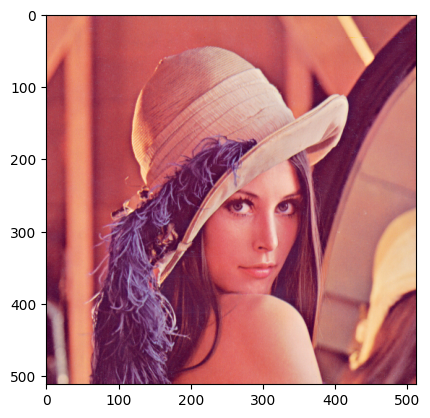

In [421]:
img = cv2.imread("image.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img);

In [422]:
img.shape

(512, 512, 3)

Функция по отрисовке серого изображения

In [423]:
def draw_gray(gray_image: np.ndarray) -> None:
    plt.imshow(np.stack([gray_image, gray_image, gray_image]).transpose(1, 2, 0));

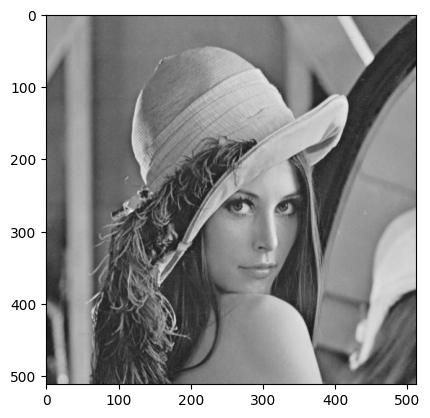

In [424]:
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) / 255
draw_gray(gray_img)

# Задание 1 Работа с шумом


1.   Сгенерировать гаусов шум, шум соль и перец на изображении и отобразить
2.   Применить фильтры на зашумленных изображениях (box filter, фильтр гаусса, медианный фильтр)
3. Отобразить результаты



## 1.1 Шум соль и перец

### 1.1.1 Имплементация метода по применению шума

In [425]:
def salt_peper(gray_image: np.ndarray[float], white_probability: float, black_probability: float) -> np.ndarray:
    h, w = gray_image.shape
    new_image = gray_image.copy()
    white_mask = np.random.random((h, w)) < white_probability
    black_mask = np.random.random((h, w)) < black_probability
    new_image[white_mask] = 1
    new_image[black_mask] = 0
    return new_image

Пример работы функции

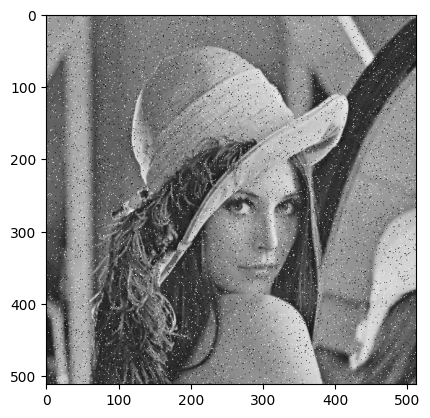

In [426]:
salt_peper_image = salt_peper(gray_img, 0.02, 0.02)
draw_gray(salt_peper_image)

Результат работы примененеия шума к изображению при различных значениях параметров вероятностей

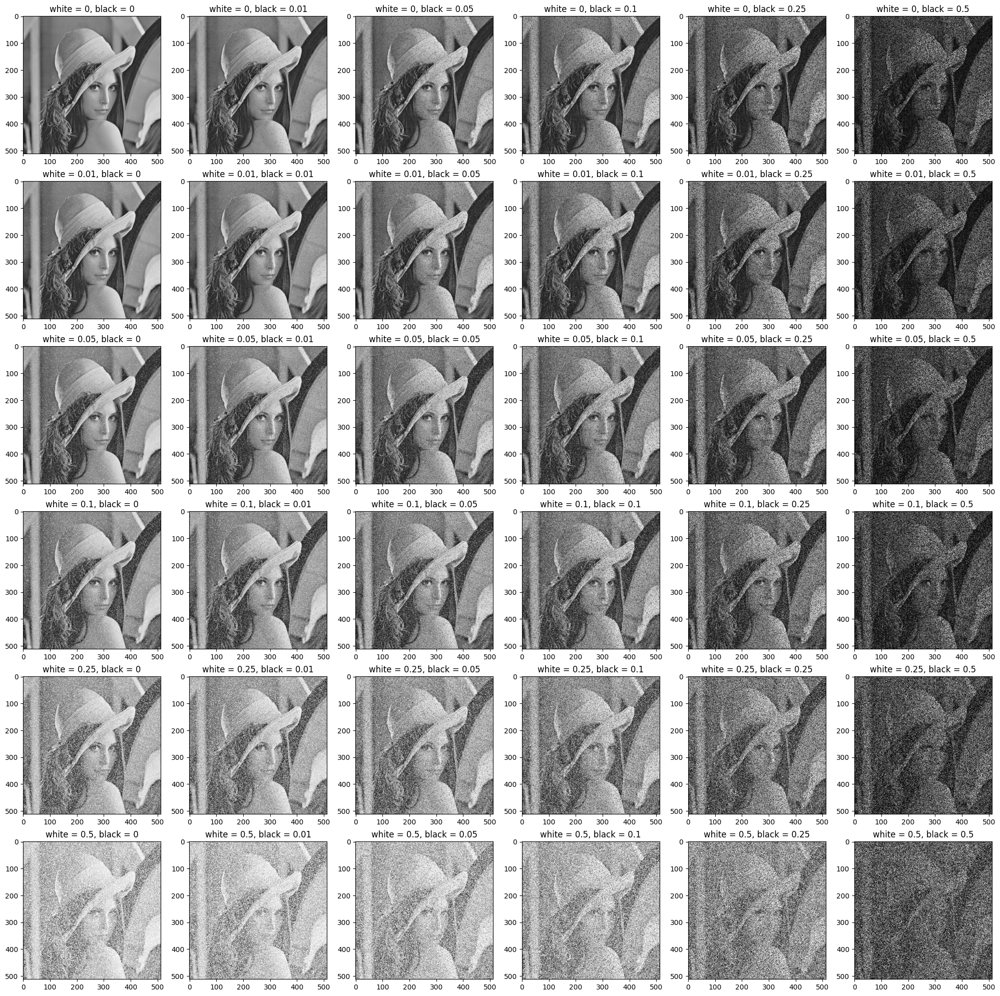

In [427]:
persents = [0, 0.01, 0.05, 0.1, 0.25, 0.5]

fig, ax = plt.subplots(len(persents), len(persents), figsize=(25, 25))
for i, p_w in enumerate(persents):
    for j, p_b in enumerate(persents):
        gray = salt_peper(gray_img, p_w, p_b)
        ax[i, j].set_title(f'white = {p_w}, black = {p_b}')
        ax[i, j].imshow(np.stack([gray, gray, gray]).transpose(1, 2, 0));

### 1.1.2 Применение фильтров к зашумленному изображению

BoxFilter

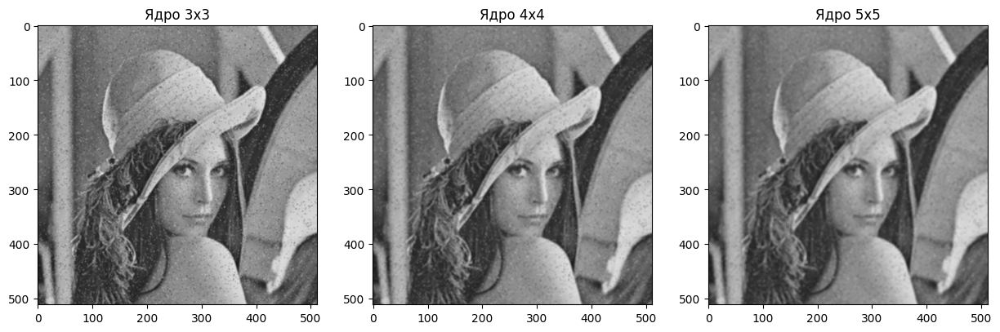

In [428]:
fig, ax = plt.subplots(1, 3, figsize=(15, 10))

for i in range(3):
    gray_filtered = cv2.boxFilter(salt_peper_image, ddepth=-1, ksize=(i + 3, i + 3))
    ax[i].imshow(np.stack([gray_filtered, gray_filtered, gray_filtered]).transpose(1, 2, 0))
    ax[i].set_title(f'Ядро {i + 3}х{i + 3}')

MedianFilter

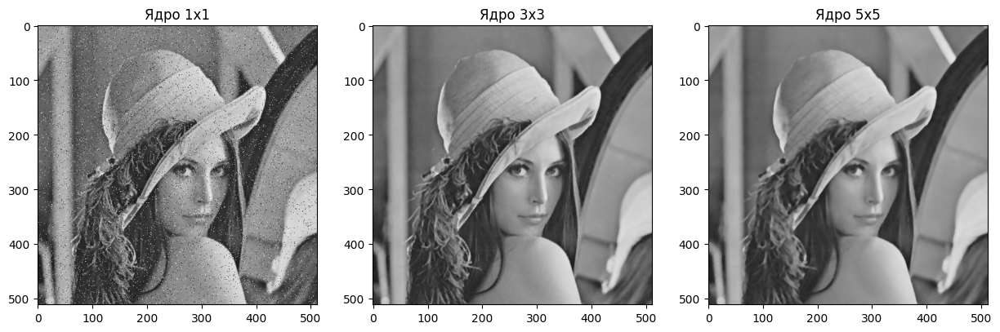

In [429]:
fig, ax = plt.subplots(1, 3, figsize=(15, 10))

kernels = [1, 3, 5]

for i, k in enumerate(kernels):
    gray_filtered = cv2.medianBlur(salt_peper_image.astype(np.float32), k)
    ax[i].imshow(np.stack([gray_filtered, gray_filtered, gray_filtered]).transpose(1, 2, 0))
    ax[i].set_title(f'Ядро {k}х{k}')

GaussianFilter

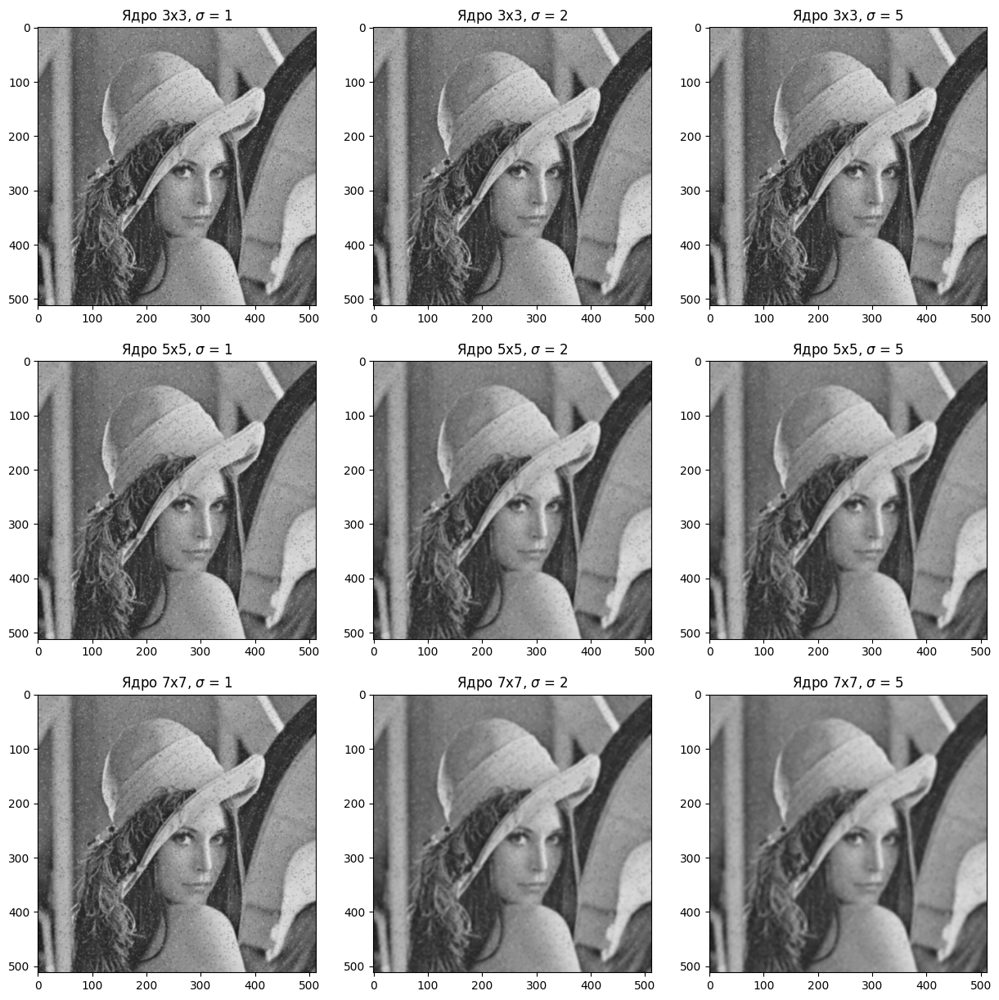

In [430]:
fig, ax = plt.subplots(3, 3, figsize=(15, 15))

kernels = [3, 5, 7]
sigmas = [1, 2, 5]

for i, k in enumerate(kernels):
    for j, s in enumerate(sigmas):
        gray_filtered = cv2.GaussianBlur(salt_peper_image.astype(np.float32), (k, k), s, s)
        ax[i, j].imshow(np.stack([gray_filtered, gray_filtered, gray_filtered]).transpose(1, 2, 0))
        ax[i, j].set_title(f'Ядро {k}х{k}, $\sigma$ = {s}')

## 1.2 Гауссов шум

In [431]:
def gaussian(gray_image: np.ndarray[float], noise_probability: float, sigma: float) -> np.ndarray:
    h, w = gray_image.shape
    new_image = gray_image.copy()
    gaussian_mask = np.random.random((h, w)) < noise_probability
    new_image[gaussian_mask] += np.random.normal(0, sigma, (h, w))[gaussian_mask]
    new_image[new_image > 1] = 1
    new_image[new_image < 0] = 0
    return new_image

Пример работы функции

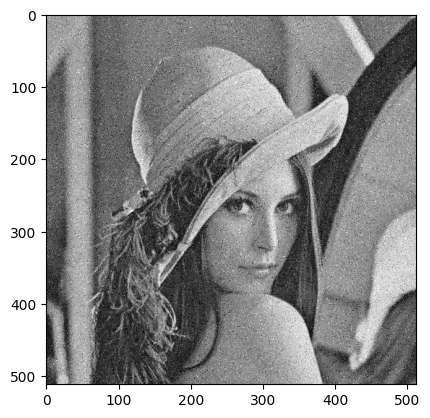

In [432]:
gaussian_image = gaussian(gray_img, 0.3, 0.15)
draw_gray(gaussian_image)

Результат работы примененеия шума к изображению при различных значениях параметров вероятности и среднеквадратического отклонения

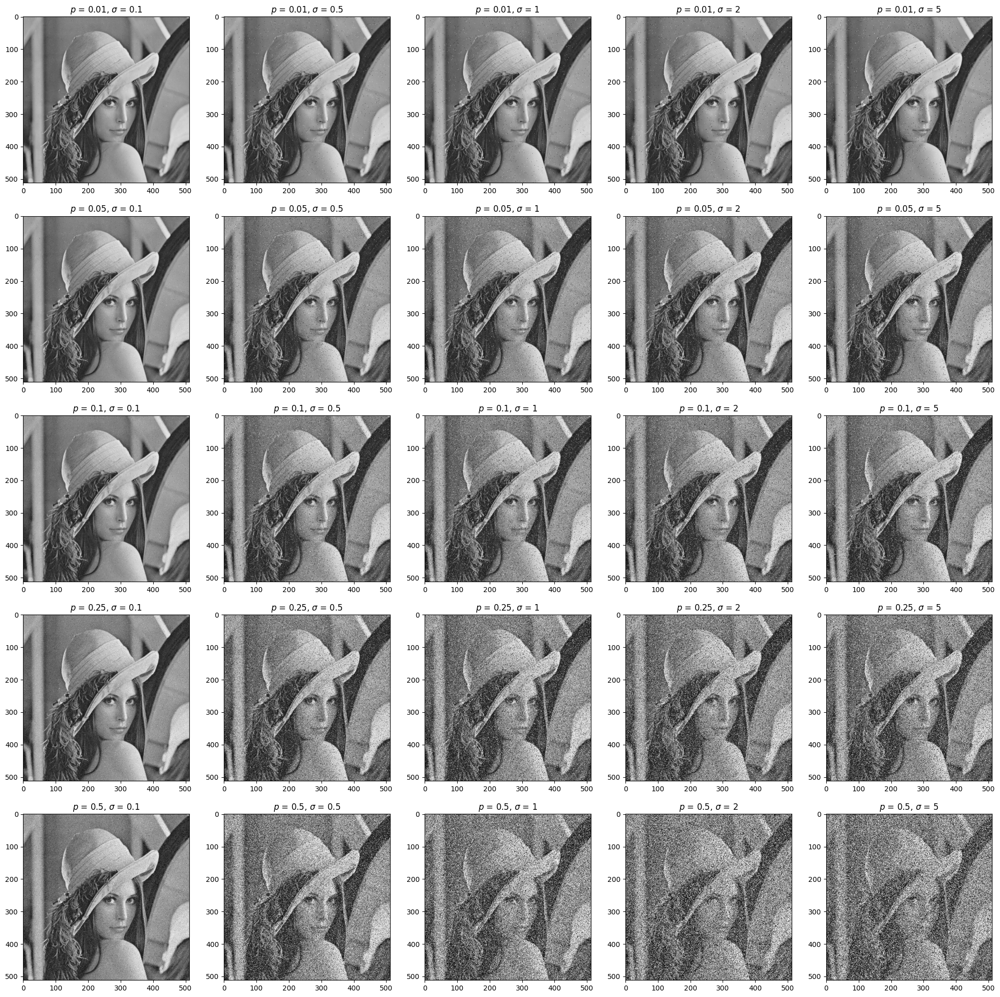

In [433]:
persents = [0.01, 0.05, 0.1, 0.25, 0.5]
sigmas = [0.1, 0.5, 1, 2, 5]

fig, ax = plt.subplots(len(persents), len(persents), figsize=(25, 25))
for i, p in enumerate(persents):
    for j, s in enumerate(sigmas):
        gray = gaussian(gray_img, p, s)
        ax[i, j].set_title(f'$p$ = {p}, $\sigma$ = {s}')
        ax[i, j].imshow(np.stack([gray, gray, gray]).transpose(1, 2, 0));

### 1.1.2 Применение фильтров к зашумленному изображению

BoxFilter

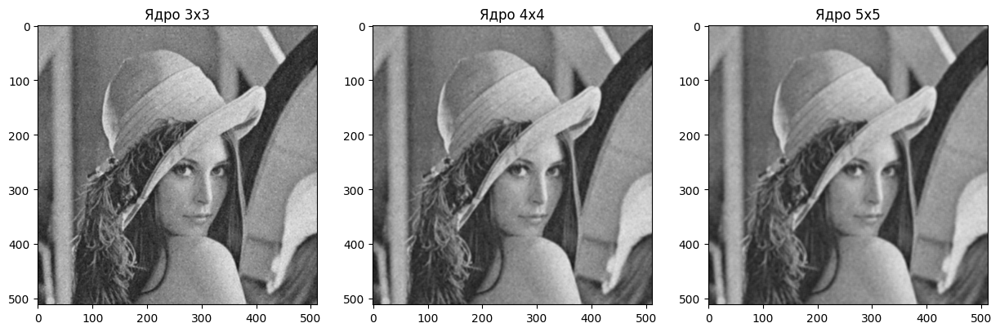

In [434]:
fig, ax = plt.subplots(1, 3, figsize=(15, 10))

for i in range(3):
    gray_filtered = cv2.boxFilter(gaussian_image, ddepth=-1, ksize=(i + 3, i + 3))
    ax[i].imshow(np.stack([gray_filtered, gray_filtered, gray_filtered]).transpose(1, 2, 0))
    ax[i].set_title(f'Ядро {i + 3}х{i + 3}')

MedianFilter

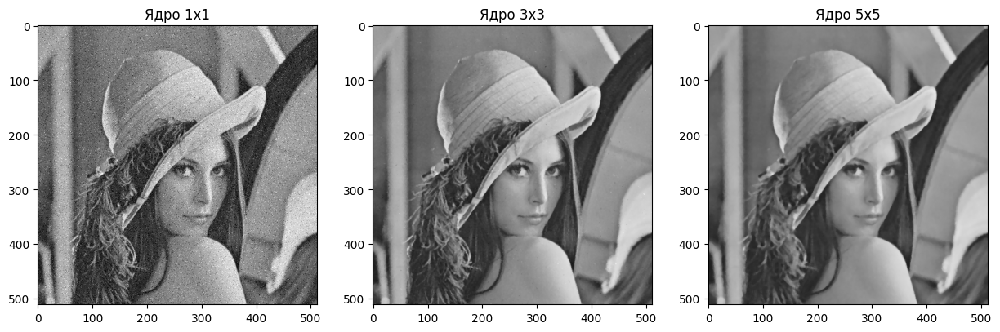

In [435]:
fig, ax = plt.subplots(1, 3, figsize=(15, 10))

for i, k in enumerate([1, 3, 5]):
    gray_filtered = cv2.medianBlur(gaussian_image.astype(np.float32), k)
    ax[i].imshow(np.stack([gray_filtered, gray_filtered, gray_filtered]).transpose(1, 2, 0))
    ax[i].set_title(f'Ядро {k}х{k}')

GaussianFilter

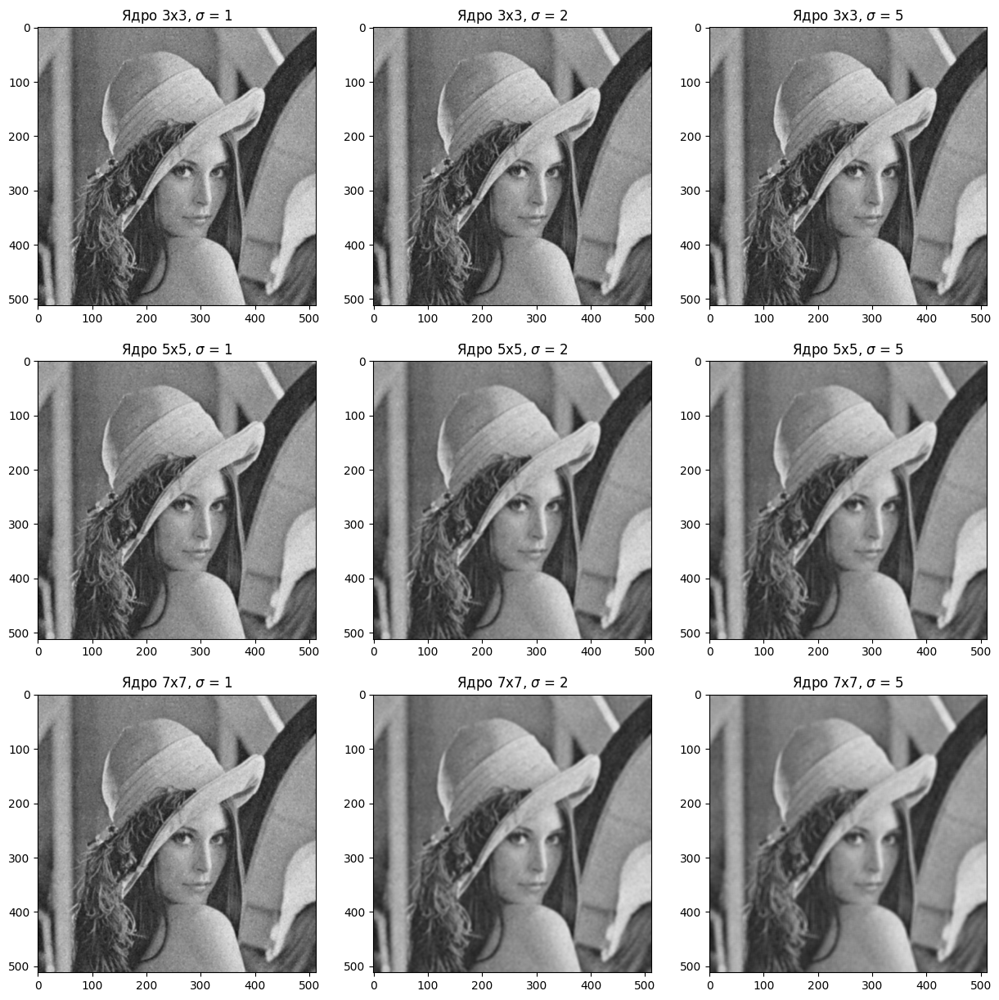

In [436]:
fig, ax = plt.subplots(3, 3, figsize=(15, 15))

kernels = [3, 5, 7]
sigmas = [1, 2, 5]

for i, k in enumerate(kernels):
    for j, s in enumerate(sigmas):
        gray_filtered = cv2.GaussianBlur(gaussian_image.astype(np.float32), (k, k), s, s)
        ax[i, j].imshow(np.stack([gray_filtered, gray_filtered, gray_filtered]).transpose(1, 2, 0))
        ax[i, j].set_title(f'Ядро {k}х{k}, $\sigma$ = {s}')

# Задание 2 Детектор границ Canny



## 2.1 Имплементация алгоритма детекции границ Canny

In [437]:
def non_maximum_suppression(gradient_magnitude: np.ndarray, angle: np.ndarray) -> np.ndarray:
    h, w = gradient_magnitude.shape
    mask = np.zeros((h, w))

    angle_mask = angle
    angle_mask[((0 <= angle_mask) & (angle_mask < 22.5)) | ((157.5 <= angle_mask) & (angle_mask <= 180))] = 0 # горизонтальное направление
    angle_mask[(22.5 <= angle_mask) & (angle_mask < 67.5)] = 1 # правое диагональное направление
    angle_mask[(67.5 <= angle_mask) & (angle_mask < 112.5)] = 2 # вертикальное направление
    angle_mask[(112.5 <= angle_mask) & (angle_mask < 157.5)] = 3 # левое диагональное направление

    padded_gradient_magnitude = np.pad(gradient_magnitude, [
        (1, 1), (1, 1)
    ], mode='edge')

    for i in range(1, h + 1):
        for j in range(1, w + 1):
            left, right = 0, 0
            match angle_mask[i - 1, j - 1]:
                case 0:
                    right = padded_gradient_magnitude[i, j + 1]
                    left = padded_gradient_magnitude[i, j - 1]
                case 1:
                    right = padded_gradient_magnitude[i + 1, j - 1]
                    left = padded_gradient_magnitude[i - 1, j + 1]
                case 2:
                    right = padded_gradient_magnitude[i + 1, j]
                    left = padded_gradient_magnitude[i - 1, j]
                case 3:
                    right = padded_gradient_magnitude[i - 1, j - 1]
                    left = padded_gradient_magnitude[i + 1, j + 1]

            value = gradient_magnitude[i - 1, j - 1]
            if value >= left and value >= right:
                mask[i - 1, j - 1] = value
    return mask


In [438]:
def double_threshold(mask: np.ndarray, low_threshold: float, high_threshold: float) -> np.ndarray:
    h, w = mask.shape
    bound_mask = np.zeros((h, w), dtype=np.float32)

    strong_index = mask >= high_threshold
    weak_index = (mask < high_threshold) & (mask > low_threshold)

    bound_mask[weak_index] = 0.5
    bound_mask[strong_index] = 1

    return bound_mask

In [439]:
def weak_selection(bound_mask: np.ndarray, window_size: int) -> np.ndarray:
    h, w = bound_mask.shape
    result = bound_mask.copy()
    steps = (
        val if (val := h // window_size) == h / window_size else val + 1,
        val if (val := w // window_size) == w / window_size else val + 1
    )
    # [(верх, низ), (лево, право)]
    pad_bound_mask = np.pad(bound_mask, [(steps[0] * window_size - h, 0), (0, steps[1] * window_size - w)], mode='edge')
    new_h, new_w = pad_bound_mask.shape
    stride = window_size
    for i in range(steps[0]):
        for j in range(steps[1]):
            window = pad_bound_mask[i * stride: (i + 1) * stride, j * stride: (j + 1) * stride]
            result[i * stride: (i + 1) * stride, j * stride: (j + 1) * stride][result[i * stride: (i + 1) * stride, j * stride: (j + 1) * stride] == 0.5] = 1 if np.any(window == 1) else 0
    return result

In [440]:
def detector_canny(gray_image: np.ndarray, sigma: float, low_threshold: float, high_threshold: float, window_size: int = 8) -> tuple[np.ndarray]:
    smooth_image = cv2.GaussianBlur(gray_image, (5, 5), sigma, sigma)
    dx = cv2.Sobel(smooth_image, ddepth=-1, dx=1, dy=0, ksize=3)
    dy = cv2.Sobel(smooth_image, ddepth=-1, dx=0, dy=1, ksize=3)
    gradient_magnitude = np.sqrt(dx ** 2 + dy ** 2)
    angle = np.arctan2(dy, dx) * 180 / np.pi
    angle[angle < 0] += 180
    mask = non_maximum_suppression(gradient_magnitude, angle)
    bound_mask = double_threshold(mask, low_threshold, high_threshold)
    res = weak_selection(bound_mask, window_size)
    return smooth_image, dx, dy, gradient_magnitude, mask, bound_mask, res

## 2.2 Пример работы алгоритма детекции границ Canny

Text(0.5, 1.0, 'Результат')

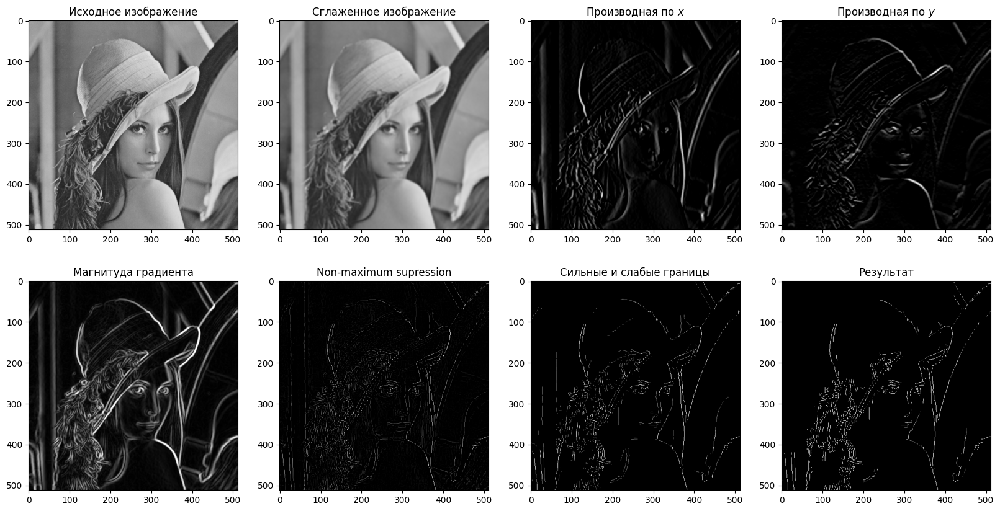

In [441]:
smooth_img, dx_img, dy_img, gradient_magnitude, mask, bound_mask, result = detector_canny(gray_img, 5, 0.3, 0.5, 20)

fig, ax = plt.subplots(2, 4, figsize=(20, 10))

ax[0, 0].imshow(np.stack([gray_img, gray_img, gray_img]).transpose(1, 2, 0))
ax[0, 0].set_title(f'Исходное изображение')

ax[0, 1].imshow(np.stack([smooth_img, smooth_img, smooth_img]).transpose(1, 2, 0))
ax[0, 1].set_title(f'Сглаженное изображение')

ax[0, 2].imshow(np.stack([dx_img, dx_img, dx_img]).transpose(1, 2, 0))
ax[0, 2].set_title(f'Производная по $x$')

ax[0, 3].imshow(np.stack([dy_img, dy_img, dy_img]).transpose(1, 2, 0))
ax[0, 3].set_title(f'Производная по $y$')

ax[1, 0].imshow(np.stack([gradient_magnitude, gradient_magnitude, gradient_magnitude]).transpose(1, 2, 0))
ax[1, 0].set_title(f'Магнитуда градиента')

ax[1, 1].imshow(np.stack([mask, mask, mask]).transpose(1, 2, 0))
ax[1, 1].set_title(f'Non-maximum supression')

ax[1, 2].imshow(np.stack([bound_mask, bound_mask, bound_mask]).transpose(1, 2, 0))
ax[1, 2].set_title(f'Сильные и слабые границы')

ax[1, 3].imshow(np.stack([result, result, result]).transpose(1, 2, 0))
ax[1, 3].set_title(f'Результат')

# Задание 3 Детектор углов Харриса

## 3.1 Имплементация алгоритма детекции углов Харриса

In [470]:
def harris_detector(gray_image: np.ndarray, sigma: float, threshold: float, alpha: float = 0.04) -> np.ndarray:
    smooth_image = cv2.GaussianBlur(gray_image, (5, 5), sigma, sigma)

    dx = cv2.Sobel(smooth_image, ddepth=-1, dx=1, dy=0, ksize=3)
    dy = cv2.Sobel(smooth_image, ddepth=-1, dx=0, dy=1, ksize=3)

    dx2 = dx ** 2
    dy2 = dy ** 2
    dxy = dx * dy

    dx2 = cv2.GaussianBlur(dx2, (5, 5), sigma, sigma)
    dy2 = cv2.GaussianBlur(dy2, (5, 5), sigma, sigma)
    dxy = cv2.GaussianBlur(dxy, (5, 5), sigma, sigma)

    det = dx2 * dy2 - dxy ** 2
    trace = dx2 + dy2

    R = det - alpha * trace ** 2
    R /= np.max(R)

    mask = np.zeros(R.shape)

    angles = R > threshold

    mask[angles] = 1
    return mask

## 3.2 пример работы алгоритма детекции углов Харриса

Функция для отрисовки углов по маске

In [538]:
def draw_angles(gray_image: np.ndarray, mask: np.ndarray):
    img = np.stack([gray_image, gray_image, gray_image]).transpose(1, 2, 0)

    red_idx = mask == 1

    img[red_idx] = (1, 0, 0)
    plt.imshow(img)

Результат работы

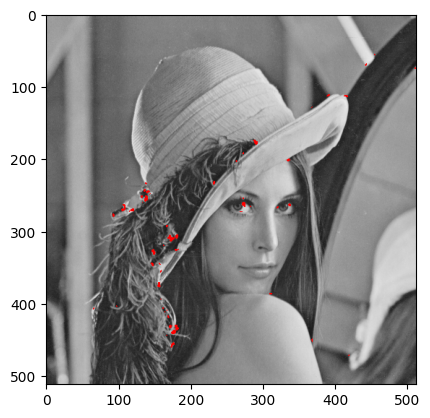

In [539]:
res = harris_detector(gray_img, 2, 0.1)
draw_angles(gray_img, res)